In [2]:
import pandas as pd
import numpy as np
import folium
import json

df = pd.read_csv("data/listings.csv")

In [3]:
neigbourhoods = df['neighbourhood_cleansed'].unique()
print(neigbourhoods)

['Indre By' 'Amager st' 'Amager Vest' 'Vesterbro-Kongens Enghave'
 'Nrrebro' 'Frederiksberg' 'Vanlse' 'sterbro' 'Valby' 'Bispebjerg'
 'Brnshj-Husum']


In [6]:
map = folium.Map([55.6761,12.5683],zoom_start=11)
with open('data/neighbourhoods.geojson') as f:
    geojson_data = json.load(f)
folium.GeoJson(geojson_data).add_to(map)

latitudes = df['latitude'].to_numpy()
longitudes = df['longitude'].to_numpy()

print(latitudes.shape)

for i in range(0,latitudes.size):
    folium.Circle(location=[latitudes[i],longitudes[i]]).add_to(map)

map

(18545,)


Vesterbro-Kongens Enghave    17.605824
Nrrebro                      17.605824
Indre By                     14.499865
sterbro                      10.574279
Frederiksberg                10.439472
Amager Vest                   8.945807
Amager st                     7.344298
Bispebjerg                    4.578053
Valby                         4.103532
Vanlse                        2.377999
Brnshj-Husum                  1.925047
Name: neighbourhood_cleansed, dtype: float64


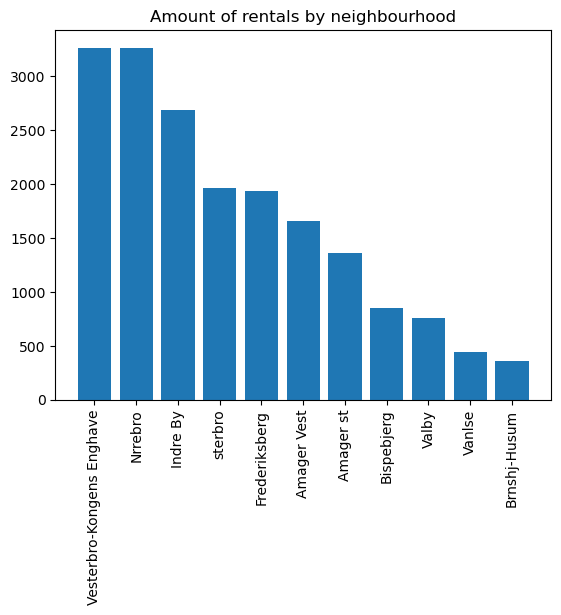

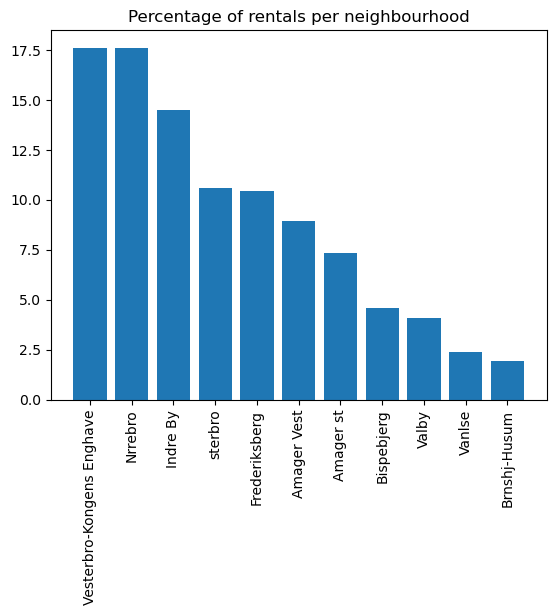

In [28]:
neigbourhoods_data = df['neighbourhood_cleansed']
neigbourhoods_counts = neigbourhoods_data.value_counts()
neigbourhoods_counts_normalized = (neigbourhoods_counts/neigbourhoods_counts.sum())*100
print(neigbourhoods_counts_normalized)
import matplotlib.pyplot as plt
plt.figure()
plt.bar(neigbourhoods_counts.index, neigbourhoods_counts)
plt.xticks(rotation='vertical')
plt.title("Amount of rentals by neighbourhood")
plt.show()

plt.figure()
plt.bar(neigbourhoods_counts_normalized.index, neigbourhoods_counts_normalized)
plt.xticks(rotation='vertical')
plt.title("Percentage of rentals per neighbourhood")
plt.show()


In [44]:
from folium import plugins
map = folium.Map([55.6761,12.5683],zoom_start=11)
heat_data = [[latitudes[i], longitudes[i]] for i in range(len(latitudes))]

heat_data
plugins.HeatMap(heat_data, radius=10, gradient={0.5: 'blue', 0.2: 'green', 1: 'red'}, blur=15).add_to(map)
map